In [1]:
import torch
import os
import numpy as np
import math
import torch.nn.functional as F
import random
import matplotlib.pyplot as plt
from pandas import DataFrame
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler
from botorch.models.gpytorch import GPyTorchModel
from gpytorch.distributions import MultivariateNormal
from gpytorch.means import ConstantMean
from gpytorch.models import ExactGP
from gpytorch.kernels import RBFKernel, ScaleKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.optim import optimize_acqf
from botorch.acquisition.analytic import ExpectedImprovement
from botorch.acquisition.analytic import PosteriorMean
from botorch.acquisition.analytic import ProbabilityOfImprovement
from botorch.acquisition.analytic import UpperConfidenceBound
from botorch.fit import fit_gpytorch_model
from botorch.models import SingleTaskGP
from botorch.models import FixedNoiseGP
from botorch.models import HeteroskedasticSingleTaskGP
from botorch.models import SingleTaskGP
from matplotlib import cm, ticker, colors
from scipy.optimize import rosen
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.dpi'] = 200
plt.rcParams['axes.unicode_minus']=False
print('Libraries imported')

Libraries imported


In [2]:
def branin_mesh(X0, X1):
    #b,c,t = 5.1/(4.*(pi)**2), 5./pi, 1./(8.*pi)
    b,c,t = 0.12918450914398066, 1.5915494309189535, 0.039788735772973836
    u = X1 - b*X0**2 + c*X0 - 6
    r = 10.*(1. - t) * np.cos(X0) + 10
    Z = u**2 + r
    return Z

## Start:choose  Branin dataset or Rosenbrock dataset

In [3]:
#--------------- branin  function
X0 = np.linspace(-5, 5, 20)
Y0 = np.linspace(0, 2, 20)
X1, Y1 = np.meshgrid(X0, Y0)
X_Y = np.stack((X1.flat, Y1.flat), axis=1)
X_split_Y = np.hsplit(X_Y, 2)
X = X_split_Y[0].ravel()
Y = X_split_Y[1].ravel()

Z = branin_mesh(X1, Y1).flatten()
Z1 = Z.reshape(20,20)
data = np.vstack((X,Y,Z)).T

In [4]:
# # ---------------import the test func -> Rosenbrock
# X0 = np.linspace(-5, 5, 20)
# Y0 = np.linspace(0, 2, 20)
# X1, Y1 = np.meshgrid(X0, Y0)
# X_Y = np.stack((X1.flat, Y1.flat), axis=1)
# X_split_Y = np.hsplit(X_Y, 2)
# X = X_split_Y[0].ravel()
# Y = X_split_Y[1].ravel()

# Z = -rosen([X, Y])  # true function -> rosenbrock
# Z1 = Z.reshape(20,20)

# # data = (np.hstack((X,Y,Z))).reshape((3, 400)).T
# data = np.vstack((X,Y,Z)).T


In [5]:
#------------ scaler --------------------
# df = DataFrame(data)
# ss = StandardScaler() #  MaxminScaler()
# data = ss.fit_transform(data)

## End

In [6]:
def get_train(candidate_xy, candidate_z):
    train_xy = torch.cat([trainxy, candidate_xy])
    train_z = torch.cat((trainz, candidate_z))
    trainset = [list(np.hsplit(train_xy.numpy(), 2)[0].ravel()),
                 list(np.hsplit(train_xy.numpy(), 2)[1].ravel()),
                 train_z.flatten().tolist()]
    
    return train_xy, train_z, trainset

In [7]:
data_index = list(map(int, np.linspace(0, data.shape[0]-1, data.shape[0])))

def get_design_domain(train_index):
    design_index = list(set(data_index).difference(set(train_index)))
    design_data = data[design_index, :]
    design_XY = torch.from_numpy(design_data[:, :2])
    design_Z = torch.from_numpy(design_data[:, -1])
    return design_data, design_XY, design_Z, design_index


In [8]:
# the inital samples' index , x's index_range 
# Assume index of the initial sample points is train_index
train_index = [22, 111, 222, 333, 399]
train_set = data[train_index, :]
# global trainxy
trainxy = torch.from_numpy(train_set[:,:2])
# global trainz
trainz = torch.from_numpy(train_set[:,-1]).unsqueeze(1)

# design_index = list(set(data_index).difference(set(train_index_1)))
design_domain, design_XY, design_Z, design_index = get_design_domain(train_index)

index_in_design_domain: 42 max_index: 41
next_point_index: 41 z: tensor([[201.7323]], dtype=torch.float64)
0
index_in_design_domain: 62 max_index: 60
next_point_index: 60 z: tensor([[198.7781]], dtype=torch.float64)
1
index_in_design_domain: 82 max_index: 79
next_point_index: 79 z: tensor([[195.8461]], dtype=torch.float64)
2
index_in_design_domain: 2 max_index: 2
next_point_index: 2 z: tensor([[207.7070]], dtype=torch.float64)
3
index_in_design_domain: 1 max_index: 1
next_point_index: 1 z: tensor([[254.3945]], dtype=torch.float64)
4
index_in_design_domain: 21 max_index: 19
next_point_index: 19 z: tensor([[251.0992]], dtype=torch.float64)
5
index_in_design_domain: 41 max_index: 37
next_point_index: 37 z: tensor([[247.8260]], dtype=torch.float64)
6
index_in_design_domain: 0 max_index: 0
next_point_index: 0 z: tensor([[308.1291]], dtype=torch.float64)
7
index_in_design_domain: 61 max_index: 54
next_point_index: 54 z: tensor([[244.5749]], dtype=torch.float64)
8
index_in_design_domain: 20 m

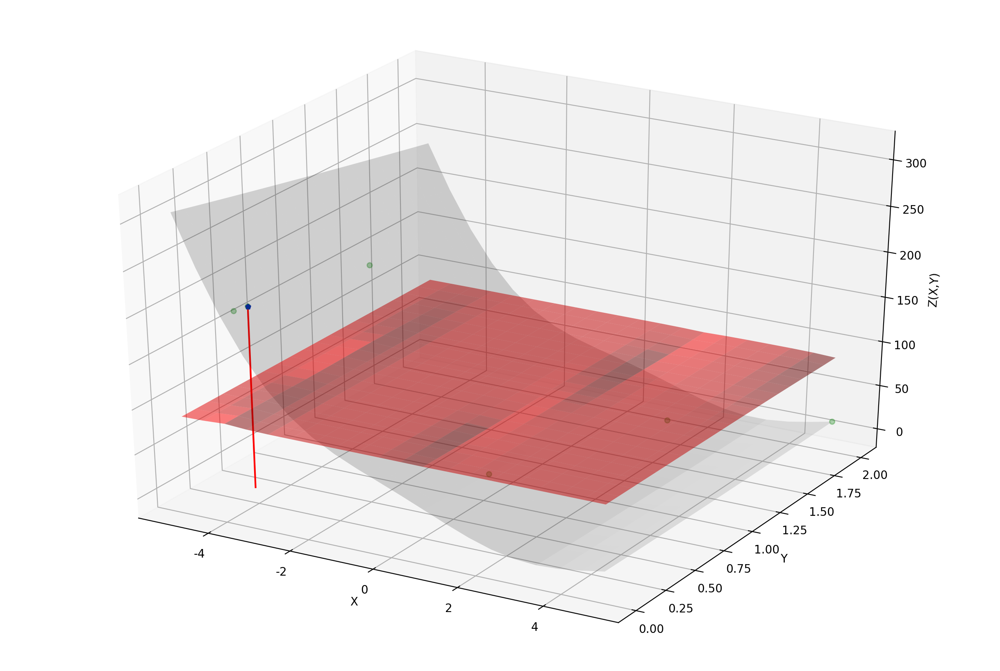

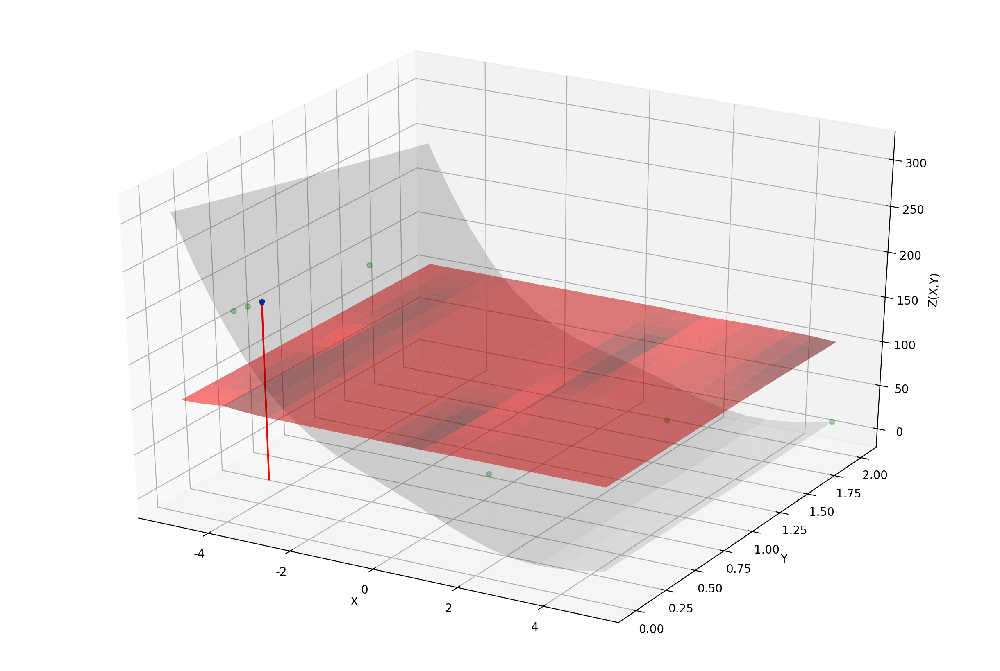

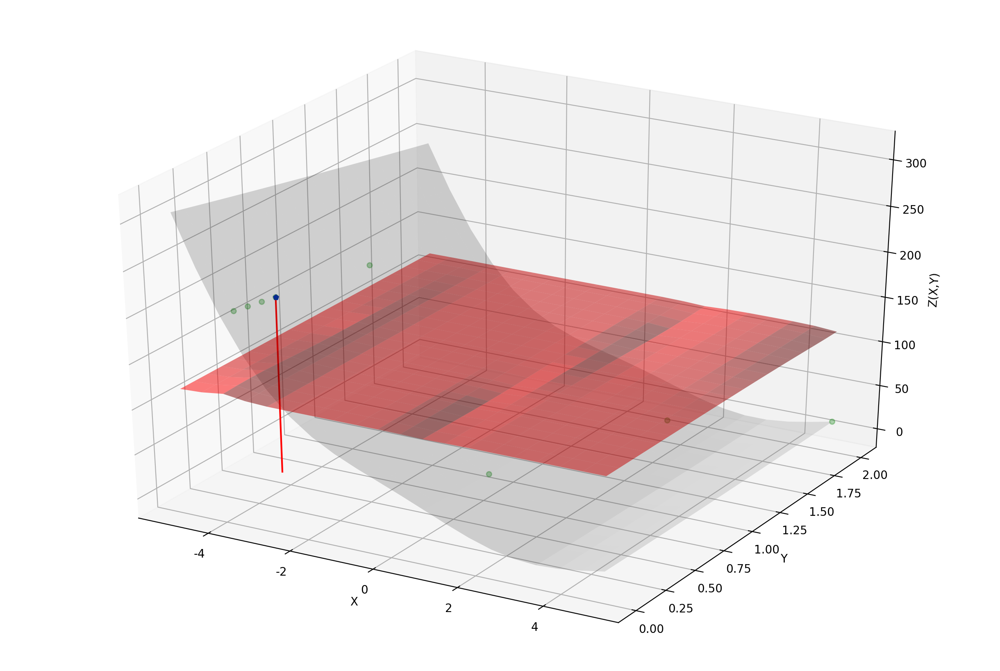

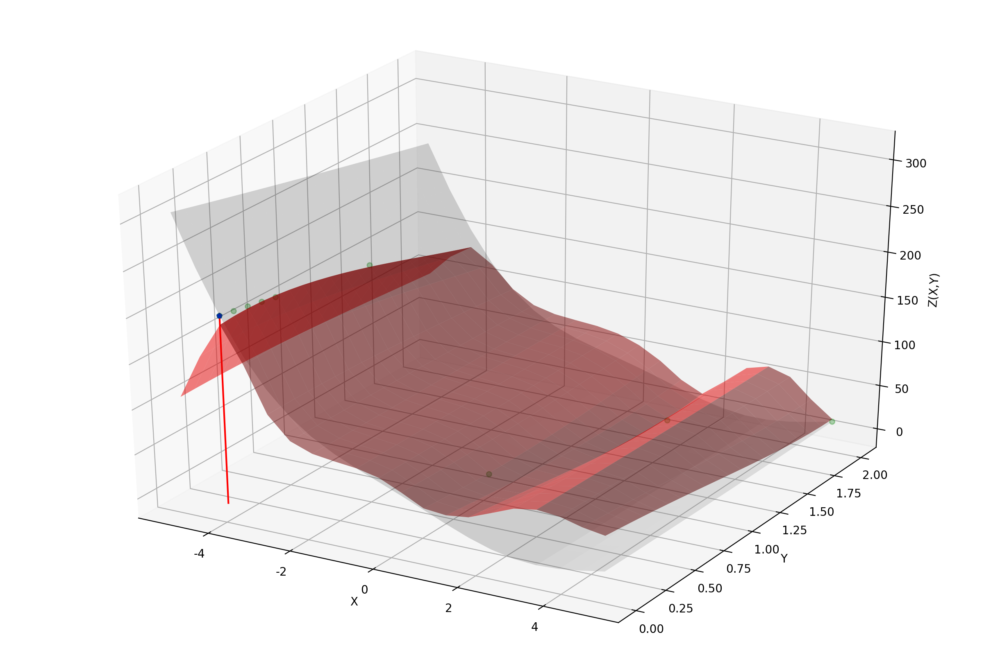

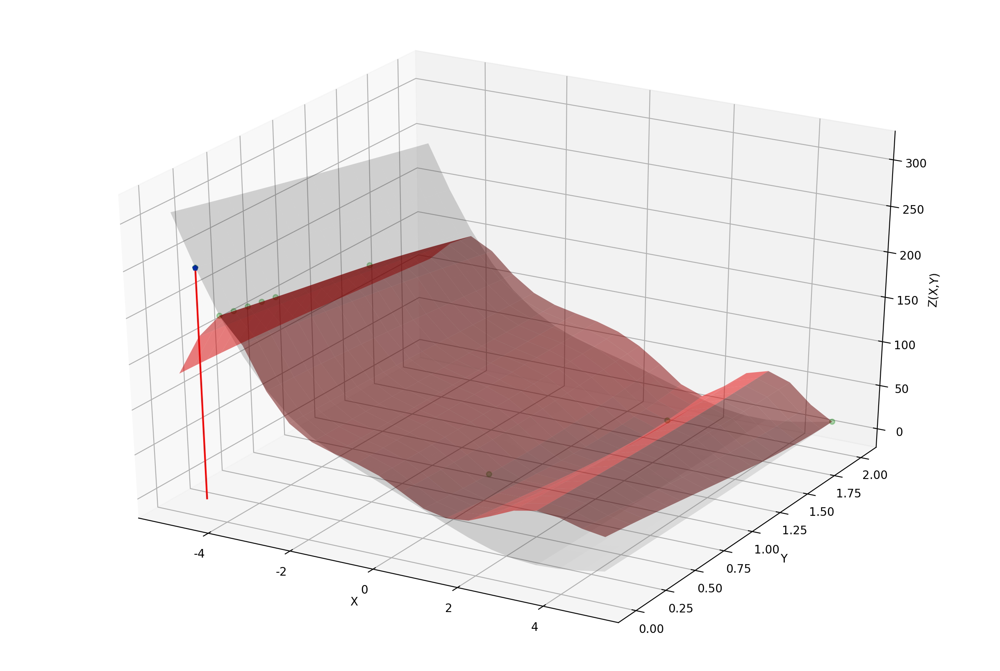

...

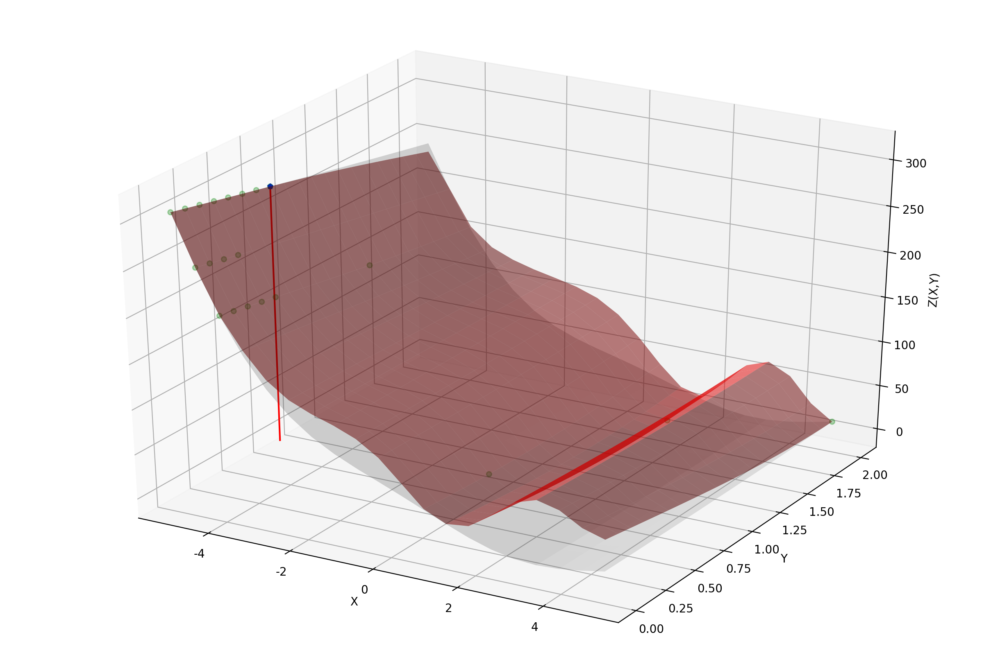

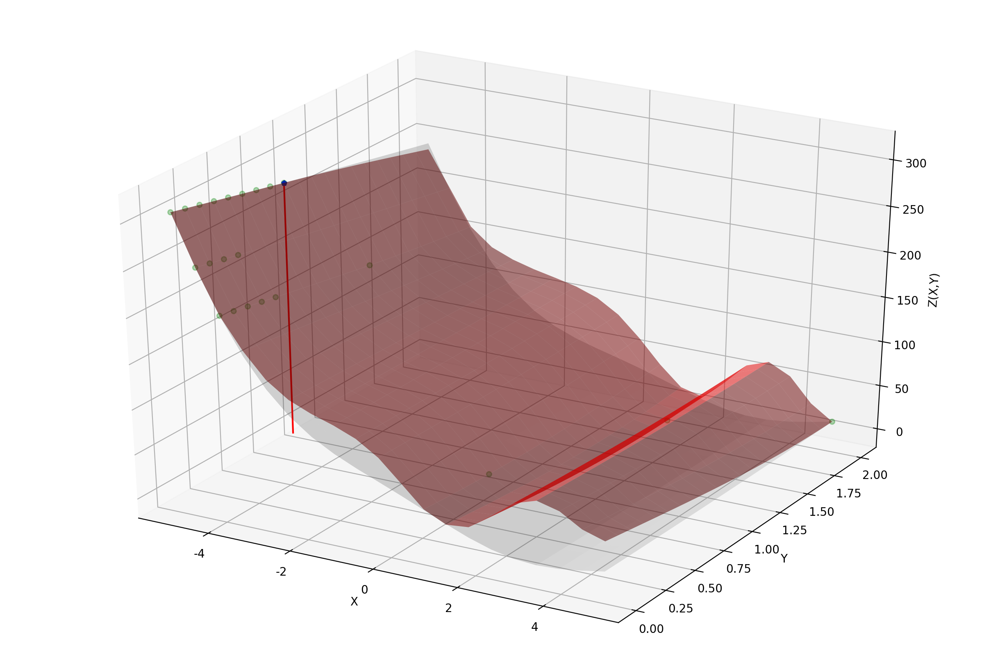

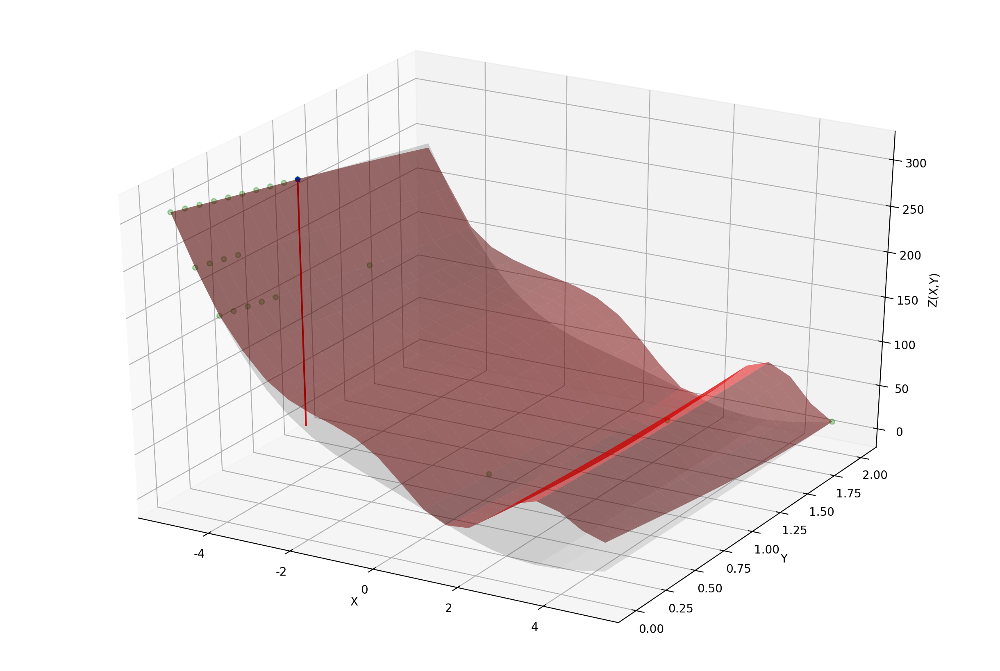

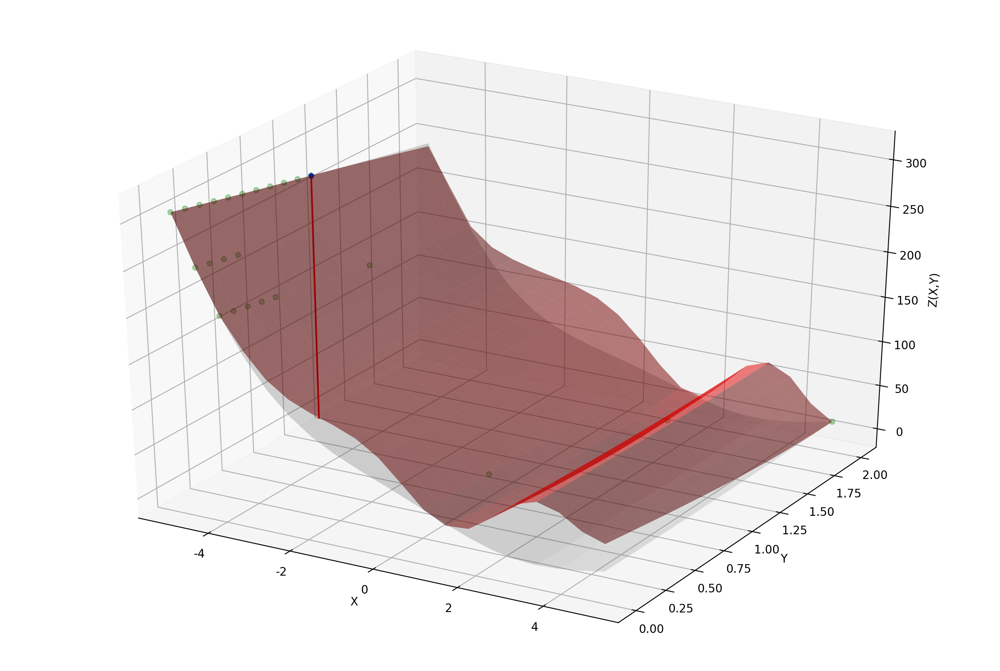

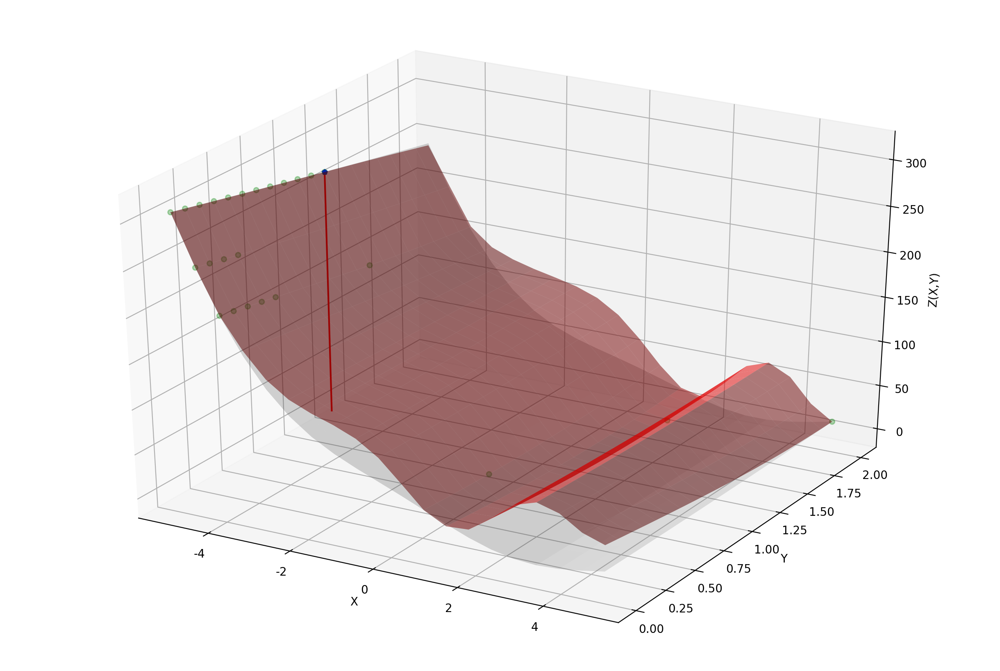

In [9]:
iteration = 20
maxindex_list = []
max_list = []
for i in range(iteration):

    # GP training
    gp = SingleTaskGP(trainxy, trainz)
    mll = ExactMarginalLogLikelihood(gp.likelihood, gp)
    fit_gpytorch_model(mll)
    pred_design = gp.posterior(design_XY).mean.detach().numpy().reshape(-1)
    # Bayesian optimization
    UCB = UpperConfidenceBound(model=gp, beta=10.0)
    acq_z = UCB(design_XY.unsqueeze(-2)) # the acquisition function's value on design domain points
    
    max_index = torch.argmax(acq_z, dim=-1).tolist()
    maxindex_list.append(max_index)
    
    index_in_design_domain = design_index[max_index]
    train_index.append(index_in_design_domain)
    print("index_in_design_domain:", index_in_design_domain, "max_index:", max_index)
    
    candidate_xy = design_XY[max_index].unsqueeze(-2)
    candidate_z = design_Z[max_index].unsqueeze(0).unsqueeze(0)
    max_list.append(candidate_z)
    print("next_point_index:",max_index, "z:", candidate_z )

    # --- Update the design domain  and train set ---
    # add the new sample to train set
    trainxy, trainz, train_set = get_train(candidate_xy, candidate_z)

    # remove the train set data from design domain
    design_domain, design_XY, design_Z, design_index = get_design_domain(train_index)

    #-----------plot function-----------------
    fig = plt.figure(figsize=(12, 8))
    ax = Axes3D(fig)
    ax.set_xlabel('X');ax.set_ylabel('Y');ax.set_zlabel('Z(X,Y)')

    #---- draw prediction on all data
    posterior_z = gp.posterior(torch.from_numpy(X_Y)).mean.detach().numpy().reshape(20, 20) #reshape 顺序是否正确？
    ax.plot_surface(X1, Y1, posterior_z, rstride=1, cstride=1 ,color='red',alpha = 0.5)

    #---- draw next point's position
    next_x = candidate_xy[0, 0]
    next_y = candidate_xy[0, 1]
    next_z = candidate_z[0,0]
    ax.scatter(next_x, next_y, next_z, color='blue', marker='p', alpha= 1)
    ax.plot([next_x, next_x], [next_y, next_y], [Z1.min() ,next_z], color='red') 
    
    #---- draw the points in train set
    ax.scatter(train_set[0], train_set[1], train_set[2], color='green', alpha=0.3)
    
    #---- draw the plane of true function
    ax.plot_surface(X1, Y1, Z1, rstride=1, cstride=1 ,color='gray',alpha=0.2)

    fig_path = 'D:\GP_BO'
    fig.savefig('D:\\GP_BO\\'+ 'rosenbrock_max_' + str(i) + '.pdf', dpi=600)
    print(i)



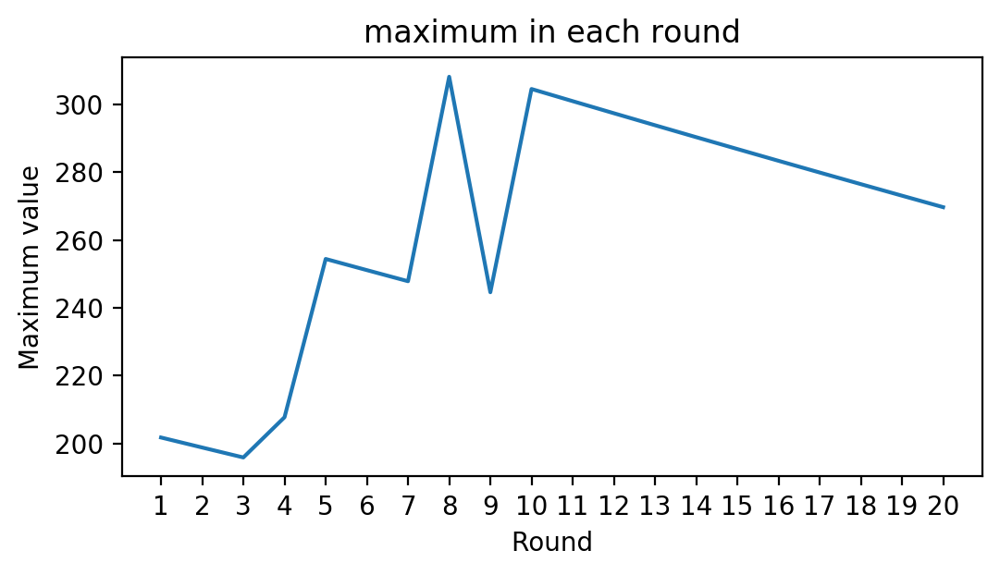

In [34]:
fig1 = plt.figure(figsize=(6,3))
x_iter = np.arange(1, iteration+1).astype(dtype=np.str)
plt.xlabel('Round')
plt.ylabel('Maximum value')
plt.title('maximum in each round')
plt.plot(x_iter, max_list)
plt.savefig('D:\\GP_BO\\'+ 'maximum in each round' '.pdf', dpi=600)